<a href="https://colab.research.google.com/github/choiyah/data_analysis/blob/main/olist_ecommerce.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 구매 활성화를 통한 매출 증대 방안 모의

Dataset: [Brazilian E-Commerce Public Dataset by Olist](https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce)

1. EDA
2. 지역별 매출 분석
3. 시기별 매출 분석
4. Seller를 위한 방안: 판매량이 높은 물품 (게시글) 분석
5. appendix: 구매/지불/입고 시점 간의 차이에 따른 관계

## 1. EDA

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
fpath='/content/drive/MyDrive/olist/'
fname_list = [fname for fname in os.listdir(fpath)]

In [ ]:
fname_list

['olist_customers_dataset.csv',
 'olist_geolocation_dataset.csv',
 'olist_order_items_dataset.csv',
 'olist_order_payments_dataset.csv',
 'olist_order_reviews_dataset.csv',
 'olist_orders_dataset.csv',
 'olist_products_dataset.csv',
 'product_category_name_translation.csv',
 'olist_sellers_dataset.csv',
 'olist_dataset.csv']

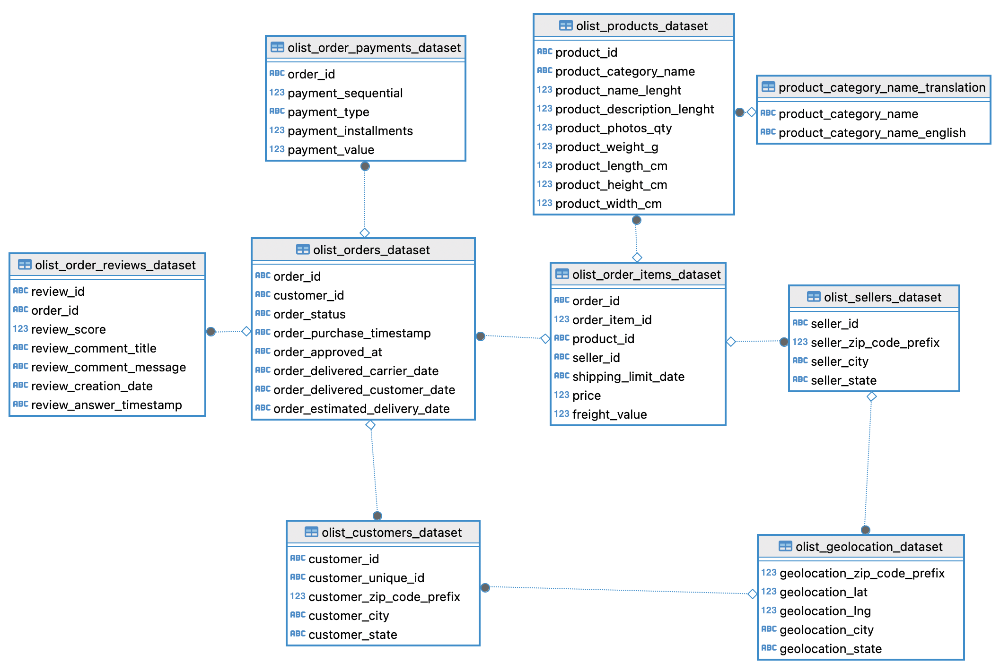

In [ ]:
# join data
import pandas as pd

df = pd.read_csv(fpath+'olist_order_items_dataset.csv')
df_ = pd.read_csv(fpath+'olist_orders_dataset.csv')

df = df.merge(df_, on='order_id', how='right')

df_ = pd.read_csv(fpath+'olist_order_payments_dataset.csv')
df = df.merge(df_, on='order_id', how='outer', validate='m:m')

df_ = pd.read_csv(fpath+'olist_order_reviews_dataset.csv')
df = df.merge(df_, on='order_id', how='outer')

df_ = pd.read_csv(fpath+'olist_products_dataset.csv')
df = df.merge(df_, on='product_id', how='outer')

df_ = pd.read_csv(fpath+'olist_customers_dataset.csv')
df = df.merge(df_, on='customer_id', how='outer')

df_ = pd.read_csv(fpath+'olist_sellers_dataset.csv')
df = df.merge(df_, on='seller_id', how='outer')

In [ ]:
df_ = pd.read_csv(fpath+'product_category_name_translation.csv')
df_

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
...,...,...
66,flores,flowers
67,artes_e_artesanato,arts_and_craftmanship
68,fraldas_higiene,diapers_and_hygiene
69,fashion_roupa_infanto_juvenil,fashion_childrens_clothes


In [ ]:
df.replace(to_replace=df_['product_category_name'].to_list(), value=df_['product_category_name_english'].to_list())['product_category_name']

0                        housewares
1                        housewares
2                        housewares
3                        housewares
4                        housewares
                    ...            
119138    construction_tools_lights
119139                         auto
119140              furniture_decor
119141              furniture_decor
119142                    perfumery
Name: product_category_name, Length: 119143, dtype: object

In [ ]:
df.replace(to_replace=df_['product_category_name'].to_list(), value=df_['product_category_name_english'].to_list(), inplace=True)

In [ ]:
# back up
# df.to_csv(fpath+'olist_dataset.csv', index=False)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119143 entries, 0 to 119142
Data columns (total 39 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       119143 non-null  object 
 1   order_item_id                  118310 non-null  float64
 2   product_id                     118310 non-null  object 
 3   seller_id                      118310 non-null  object 
 4   shipping_limit_date            118310 non-null  object 
 5   price                          118310 non-null  float64
 6   freight_value                  118310 non-null  float64
 7   customer_id                    119143 non-null  object 
 8   order_status                   119143 non-null  object 
 9   order_purchase_timestamp       119143 non-null  object 
 10  order_approved_at              118966 non-null  object 
 11  order_delivered_carrier_date   117057 non-null  object 
 12  order_delivered_customer_date 

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
len(df)

119143

In [ ]:
# 주문 수
df.order_id.nunique()

99441

In [ ]:
# 판매한 상품 수
df.product_id.nunique()

32951

In [ ]:
# 고객 수
df.customer_id.nunique()

99441

In [ ]:
# 판매자 수
df.seller_id.nunique()

3095

In [ ]:
# 리뷰 수
df.review_id.nunique()

98410

같은 order_id가 여럿인 경우, 결제 또는 주문 개수와 연관
- 분할 결제 (payment_sequential)
- 상품별 주문 개수 (order_item_id)

In [ ]:
# check price, frieght_value, payment_value
# order id: e481f51cbdc54678b7cc49136f2d6af7
df[df.order_id=='e481f51cbdc54678b7cc49136f2d6af7'][['price','freight_value','payment_sequential','payment_type', 'payment_installments', 'payment_value']]

,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
0,29.99,8.72,1.0,credit_card,1.0,18.12
1,29.99,8.72,3.0,voucher,1.0,2.00
2,29.99,8.72,2.0,voucher,1.0,18.59


In [ ]:
df.payment_type.unique()

array(['credit_card', 'voucher', 'boleto', 'debit_card', 'not_defined',
       nan], dtype=object)

In [ ]:
# order_id: 00143d0f86d6fbd9f9b38ab440ac16f5의 총 주문 금액은 109.29
# 이 주문은 같은 상품을 3개 구매한 주문내역
df[df.order_id=='00143d0f86d6fbd9f9b38ab440ac16f5'][['order_item_id', 'product_id', 'price','freight_value','payment_sequential','payment_type', 'payment_installments', 'payment_value']]

,order_item_id,product_id,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
81290,1.0,e95ee6822b66ac6058e2e4aff656071a,21.33,15.1,1.0,credit_card,1.0,109.29
81291,2.0,e95ee6822b66ac6058e2e4aff656071a,21.33,15.1,1.0,credit_card,1.0,109.29
81292,3.0,e95ee6822b66ac6058e2e4aff656071a,21.33,15.1,1.0,credit_card,1.0,109.29


In [ ]:
# check order_item_id
df[round(df.price + df.freight_value,2) != df.payment_value].order_id.nunique()

13455

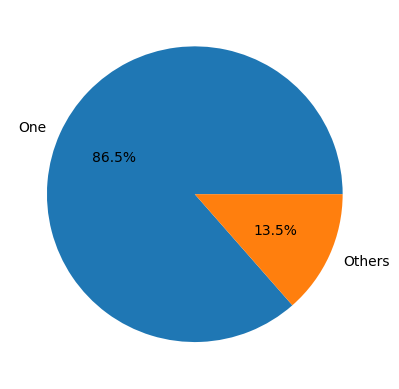

In [ ]:
one = df[round(df.price + df.freight_value,2) == df.payment_value].order_id.nunique()
total = df.order_id.nunique()

ratio = [one, total-one]
labels = ['One', 'Others']

plt.pie(ratio, labels=labels, autopct='%.1f%%')
plt.show()

총 주문 중 87.1%가 단일 상품을 하나만 주문하였다.

In [ ]:
cols = [
    'order_id',
    'order_status',
    'order_purchase_timestamp',
    'order_approved_at',
    'order_delivered_carrier_date',
    'order_delivered_customer_date',
    'order_estimated_delivery_date'
]

In [ ]:
df['order_status'].unique()

array(['delivered', 'shipped', 'canceled', 'invoiced', 'processing',
       'unavailable', 'created', 'approved'], dtype=object)

In [ ]:
df[df.order_status=='delivered'][cols].head()

,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,e481f51cbdc54678b7cc49136f2d6af7,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
2,e481f51cbdc54678b7cc49136f2d6af7,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
3,128e10d95713541c87cd1a2e48201934,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00
4,0e7e841ddf8f8f2de2bad69267ecfbcf,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15 00:00:00


In [ ]:
df[df.order_status=='shipped'][cols].head()

,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
178,1b1d6a3f8e1369c613eb19c40dab5624,shipped,2018-03-13 20:56:03,2018-03-13 21:10:31,2018-03-14 20:03:34,NaN,2018-04-04 00:00:00
234,3a53d5a9a0c58d291ff3ae407b6df5fd,shipped,2018-02-16 21:55:03,2018-02-17 01:26:58,2018-02-19 16:14:14,NaN,2018-03-14 00:00:00
342,72c501775cf36e99076132aaee5ae9c0,shipped,2017-12-01 12:39:39,2017-12-02 02:37:10,2017-12-04 20:39:56,NaN,2017-12-19 00:00:00
451,37726a8b1cbcf77034870df2521be6f6,shipped,2018-03-07 10:06:01,2018-03-07 10:15:51,2018-03-08 18:17:02,NaN,2018-03-28 00:00:00
499,75687059537f4b53423dc1d645c6822f,shipped,2018-02-28 21:28:33,2018-02-28 21:48:26,2018-03-03 00:05:26,NaN,2018-03-19 00:00:00


In [ ]:
df[df.order_status=='canceled'][cols].head()

,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
1557,5b3367de06e5c2955a98de36a52fbe1a,canceled,2017-03-07 12:43:03,2017-03-07 13:04:43,NaN,NaN,2017-03-28 00:00:00
2258,c4ca4450ac2974ba5eeb4832b7ec724a,canceled,2017-05-12 10:28:30,2017-05-12 10:42:45,NaN,NaN,2017-06-05 00:00:00
2259,c4ca4450ac2974ba5eeb4832b7ec724a,canceled,2017-05-12 10:28:30,2017-05-12 10:42:45,NaN,NaN,2017-06-05 00:00:00
2260,c4ca4450ac2974ba5eeb4832b7ec724a,canceled,2017-05-12 10:28:30,2017-05-12 10:42:45,NaN,NaN,2017-06-05 00:00:00
2261,c4ca4450ac2974ba5eeb4832b7ec724a,canceled,2017-05-12 10:28:30,2017-05-12 10:42:45,NaN,NaN,2017-06-05 00:00:00


In [ ]:
df[df.order_status=='invoiced'][cols].head()

,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
2636,136cce7faa42fdb2cefd53fdc79a6098,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaN,NaN,2017-05-09 00:00:00
2660,8a43a2a954395f1f2911a8280575ab9c,invoiced,2017-06-06 19:26:58,2017-06-06 19:42:12,NaN,NaN,2017-07-03 00:00:00
2661,8a43a2a954395f1f2911a8280575ab9c,invoiced,2017-06-06 19:26:58,2017-06-06 19:42:12,NaN,NaN,2017-07-03 00:00:00
2665,615e54068238441742c4daf6a7b4ccff,invoiced,2017-11-13 16:27:09,2017-11-14 04:26:44,NaN,NaN,2017-12-01 00:00:00
2666,615e54068238441742c4daf6a7b4ccff,invoiced,2017-11-13 16:27:09,2017-11-14 04:26:44,NaN,NaN,2017-12-01 00:00:00


In [ ]:
df[df.order_status=='processing'][cols].head()

,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
9072,265271dd979e1221bab55d039af24b37,processing,2017-12-15 10:43:11,2017-12-15 10:55:17,NaN,NaN,2018-01-10 00:00:00
14054,83fb50047ae335655fcb980c0a2430b5,processing,2017-05-27 17:48:11,2017-05-30 05:02:21,NaN,NaN,2017-06-29 00:00:00
31754,bc50c4b649fb077defd8c5b6f1337468,processing,2017-10-10 11:49:24,2017-10-11 03:49:26,NaN,NaN,2017-10-27 00:00:00
31755,bc50c4b649fb077defd8c5b6f1337468,processing,2017-10-10 11:49:24,2017-10-11 03:49:26,NaN,NaN,2017-10-27 00:00:00
31756,bc50c4b649fb077defd8c5b6f1337468,processing,2017-10-10 11:49:24,2017-10-11 03:49:26,NaN,NaN,2017-10-27 00:00:00


In [ ]:
df[df.order_status=='unavailable'][cols].head()

,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
55321,1a47da1d66c70489c8e35fe2b5433ab7,unavailable,2016-10-07 18:16:31,2016-10-07 18:53:48,NaN,NaN,2016-12-07 00:00:00
55950,4dd47e84e6b8ff4a63d0b8425e6d788e,unavailable,2016-10-06 23:49:18,2016-10-07 01:09:08,NaN,NaN,2016-11-24 00:00:00
60001,8e24261a7e58791d10cb1bf9da94df5c,unavailable,2017-11-16 15:09:28,2017-11-16 15:26:57,NaN,NaN,2017-12-05 00:00:00
60002,c272bcd21c287498b4883c7512019702,unavailable,2018-01-31 11:31:37,2018-01-31 14:23:50,NaN,NaN,2018-02-16 00:00:00
60003,37553832a3a89c9b2db59701c357ca67,unavailable,2017-08-14 17:38:02,2017-08-17 00:15:18,NaN,NaN,2017-09-05 00:00:00


In [ ]:
df[df.order_status=='created'][cols].head()

,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
60060,b5359909123fa03c50bdb0cfed07f098,created,2017-12-05 01:07:52,NaN,NaN,NaN,2018-01-11 00:00:00
60078,dba5062fbda3af4fb6c33b1e040ca38f,created,2018-02-09 17:21:04,NaN,NaN,NaN,2018-03-07 00:00:00
60173,7a4df5d8cff4090e541401a20a22bb80,created,2017-11-25 11:10:33,NaN,NaN,NaN,2017-12-12 00:00:00
60473,35de4050331c6c644cddc86f4f2d0d64,created,2017-12-05 01:07:58,NaN,NaN,NaN,2018-01-08 00:00:00
60497,90ab3e7d52544ec7bc3363c82689965f,created,2017-11-06 13:12:34,NaN,NaN,NaN,2017-12-01 00:00:00


In [ ]:
df[df.order_status=='approved'][cols].head()

,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
109254,a2e4c44360b4a57bdff22f3a4630c173,approved,2017-02-06 20:18:17,2017-02-06 20:30:19,NaN,NaN,2017-03-01 00:00:00
109255,a2e4c44360b4a57bdff22f3a4630c173,approved,2017-02-06 20:18:17,2017-02-06 20:30:19,NaN,NaN,2017-03-01 00:00:00
119051,132f1e724165a07f6362532bfb97486e,approved,2017-04-25 01:25:34,2017-04-30 20:32:41,NaN,NaN,2017-05-22 00:00:00


<Axes: ylabel='order_id'>

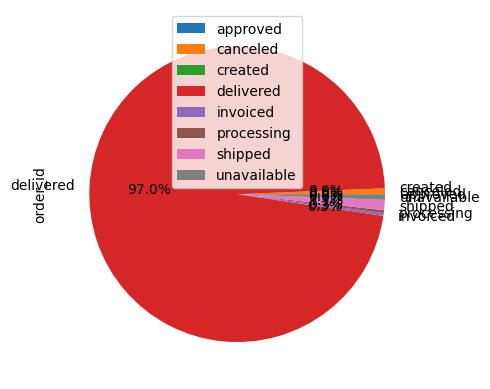

In [ ]:
import matplotlib.pyplot as plt
tmp = df[['order_id', 'order_status']].copy()
tmp.drop_duplicates(inplace=True)
tmp.groupby('order_status').count().plot.pie(y='order_id', autopct='%.1f%%')

전체 주문 중 order_status가 배송 완료 (delivered)인 주문이 97%로 대다수를 차지한다.

## 전처리
- order_status=='delivered'
- order_item_id: 주문 내 product_id 별로 total_price, total_freight_value 계산
- total_price: total_price + total_freight_value
* 결제 방법 (payment_type)는 무시

1. order_id (MultiIndex)
2. product_id (MultiIndex)
3. seller_id (MultiIndex)
3. total_payment_value
4. total_price
5. total_freight_value
6. customer_state
7. seller_state
8. product_category_name
9. order_purchase_timestamp


In [ ]:
target = df.copy()

In [ ]:
target = target[target.order_status=='delivered']

In [ ]:
col = ['order_id',
       'product_id',
       'seller_id',
       'order_item_id',
       'price',
       'freight_value',
       'customer_state',
       'seller_state',
       'product_category_name',
       'order_purchase_timestamp']

In [ ]:
target = target[col]

In [ ]:
# order_item_id: 주문 내 product_id 별로 total_price, total_freight_value 계산
target['total_product_price'] = target.order_item_id * target.price
target['total_freight_value'] = target.order_item_id * target.freight_value

In [ ]:
target.sort_values(by=['order_id', 'product_id', 'seller_id', 'order_item_id'], inplace=True)
target.drop_duplicates(subset=['order_id', 'product_id', 'seller_id'], keep='last', inplace=True)

In [ ]:
target['total_price'] = target.total_product_price + target.total_freight_value

In [ ]:
target

,order_id,product_id,seller_id,order_item_id,price,freight_value,customer_state,seller_state,product_category_name,order_purchase_timestamp,total_product_price,total_freight_value,total_price
78615,00010242fe8c5a6d1ba2dd792cb16214,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,1.0,58.90,13.29,RJ,SP,cool_stuff,2017-09-13 08:59:02,58.90,13.29,72.19
106193,00018f77f2f0320c557190d7a144bdd3,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,1.0,239.90,19.93,SP,SP,pet_shop,2017-04-26 10:53:06,239.90,19.93,259.83
58448,000229ec398224ef6ca0657da4fc703e,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,1.0,199.00,17.87,MG,MG,furniture_decor,2018-01-14 14:33:31,199.00,17.87,216.87
114393,00024acbcdf0a6daa1e931b038114c75,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,1.0,12.99,12.79,SP,SP,perfumery,2018-08-08 10:00:35,12.99,12.79,25.78
92859,00042b26cf59d7ce69dfabb4e55b4fd9,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,1.0,199.90,18.14,SP,PR,garden_tools,2017-02-04 13:57:51,199.90,18.14,218.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...
76124,fffc94f6ce00a00581880bf54a75a037,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,1.0,299.99,43.41,MA,SC,housewares,2018-04-23 13:57:06,299.99,43.41,343.40
109451,fffcd46ef2263f404302a634eb57f7eb,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,1.0,350.00,36.53,PR,SP,computers_accessories,2018-07-14 10:26:46,350.00,36.53,386.53
89012,fffce4705a9662cd70adb13d4a31832d,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,1.0,99.90,16.95,SP,PR,sports_leisure,2017-10-23 17:07:56,99.90,16.95,116.85
77556,fffe18544ffabc95dfada21779c9644f,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,1.0,55.99,8.72,SP,SP,computers_accessories,2017-08-14 23:02:59,55.99,8.72,64.71


In [ ]:
target.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100196 entries, 78615 to 89685
Data columns (total 13 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   order_id                  100196 non-null  object 
 1   product_id                100196 non-null  object 
 2   seller_id                 100196 non-null  object 
 3   order_item_id             100196 non-null  float64
 4   price                     100196 non-null  float64
 5   freight_value             100196 non-null  float64
 6   customer_state            100196 non-null  object 
 7   seller_state              100196 non-null  object 
 8   product_category_name     98795 non-null   object 
 9   order_purchase_timestamp  100196 non-null  object 
 10  total_product_price       100196 non-null  float64
 11  total_freight_value       100196 non-null  float64
 12  total_price               100196 non-null  float64
dtypes: float64(6), object(7)
memory usage: 10

order_id / product_id / seller_id를 기준으로 생성한 데이터는

주문 상품에 대한 판매자의 지역과 주문 내에서 상품 단가와 주문 개수가 보존된다.


In [ ]:
target.order_id.nunique()

96478

In [ ]:
target.dropna(inplace=True)

In [ ]:
target.order_id.nunique()

95146

# 2. 지역별 매출 분석
1) 지역별 매출량 (수 & 금액) 확인
    
    -> 전체 구매액: Southeast > South > Northeast > Midwest > North
    -> 평균 구매액: Northeast > Southeast > North > South > Midwest
    -> 고객 지역별 배송비: Northeast > South > North > Southeast > Midwest

2) 지역별로 가장 많이 구매 또는 판매하는 카테고리
- 전체 판매액 순위
- 지역별 구매액 순위 (구매력 확인)


    -> 전체 판매액 (only 상품 금액)에서 health beauty 카테고리가 1순위
    -> Northeast 지역의 구매 카테고리로 health beauty가 1순위
    -> health beauty 카테고리 내 지역별 구매액 2순위 Northeast




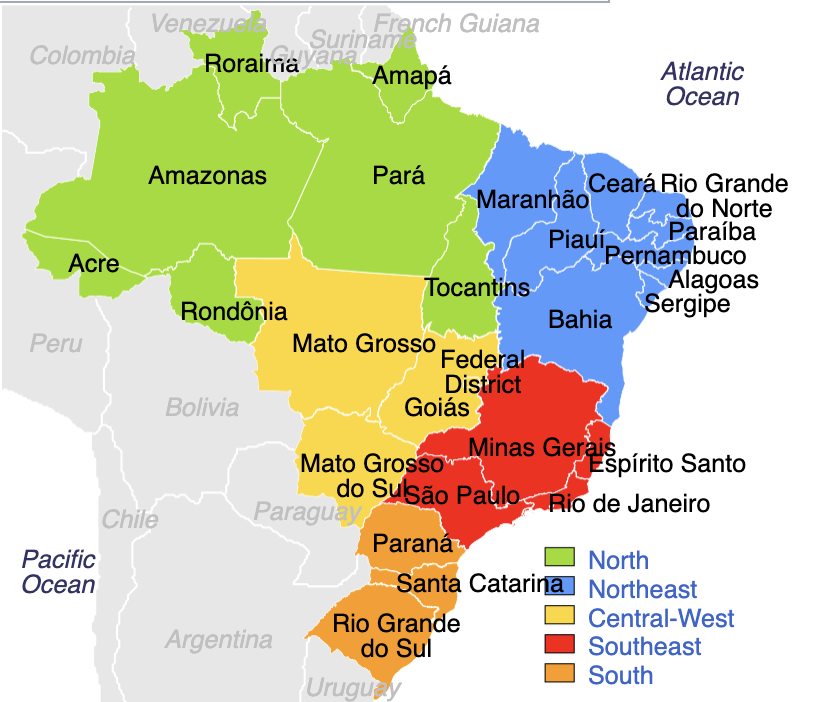

In [ ]:
southeast = ['SP', 'RJ', 'ES','MG']
northeast= ['MA', 'PI', 'CE', 'RN', 'PE', 'PB', 'SE', 'AL', 'BA']
north =  ['AM', 'RR', 'AP', 'PA', 'TO', 'RO', 'AC']
midwest = ['MT', 'GO', 'MS' ,'DF' ]
south = ['SC', 'RS', 'PR']

In [ ]:
target.loc[target['customer_state'].isin(southeast), 'cust_Region'] = 'Southeast'
target.loc[target['customer_state'].isin(northeast), 'cust_Region'] = 'Northeast'
target.loc[target['customer_state'].isin(north), 'cust_Region'] = 'North'
target.loc[target['customer_state'].isin(midwest), 'cust_Region'] = 'Midwest'
target.loc[target['customer_state'].isin(south), 'cust_Region'] = 'South'

target.loc[target['seller_state'].isin(southeast), 'seller_Region'] = 'Southeast'
target.loc[target['seller_state'].isin(northeast), 'seller_Region'] = 'Northeast'
target.loc[target['seller_state'].isin(north), 'seller_Region'] = 'North'
target.loc[target['seller_state'].isin(midwest), 'seller_Region'] = 'Midwest'
target.loc[target['seller_state'].isin(south), 'seller_Region'] = 'South'

In [ ]:
target.head()

,order_id,product_id,seller_id,order_item_id,price,freight_value,customer_state,seller_state,product_category_name,order_purchase_timestamp,total_product_price,total_freight_value,total_price,cust_Region,seller_Region
78615,00010242fe8c5a6d1ba2dd792cb16214,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,1.0,58.90,13.29,RJ,SP,cool_stuff,2017-09-13 08:59:02,58.90,13.29,72.19,Southeast,Southeast
106193,00018f77f2f0320c557190d7a144bdd3,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,1.0,239.90,19.93,SP,SP,pet_shop,2017-04-26 10:53:06,239.90,19.93,259.83,Southeast,Southeast
58448,000229ec398224ef6ca0657da4fc703e,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,1.0,199.00,17.87,MG,MG,furniture_decor,2018-01-14 14:33:31,199.00,17.87,216.87,Southeast,Southeast
114393,00024acbcdf0a6daa1e931b038114c75,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,1.0,12.99,12.79,SP,SP,perfumery,2018-08-08 10:00:35,12.99,12.79,25.78,Southeast,Southeast
92859,00042b26cf59d7ce69dfabb4e55b4fd9,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,1.0,199.90,18.14,SP,PR,garden_tools,2017-02-04 13:57:51,199.90,18.14,218.04,Southeast,South


In [ ]:
# 구매 평균 금액
import seaborn as sns
region = ['North', 'Northeast', 'Midwest', 'Southeast', 'South']
ct = pd.crosstab(target.seller_Region, target.cust_Region, values=target.total_product_price, aggfunc='mean').fillna(0)
ct = ct.reindex(region, axis="rows")
ct = ct.reindex(region, axis="columns")
ct.style.set_precision(2).background_gradient(cmap=sns.light_palette("blue", as_cmap=True), axis=1) # seller 기준 (평균 구매액 높은 지역)

<ipython-input-480-223839bfb6f9>:7: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



cust_Region,North,Northeast,Midwest,Southeast,South
seller_Region,,,,,
North,0.00,346.34,0.00,304.71,152.36
Northeast,417.15,283.64,273.99,290.30,345.53
Midwest,129.73,152.42,99.12,130.32,136.14
Southeast,166.24,148.15,139.86,122.74,128.89
South,247.00,252.13,218.95,162.46,154.75


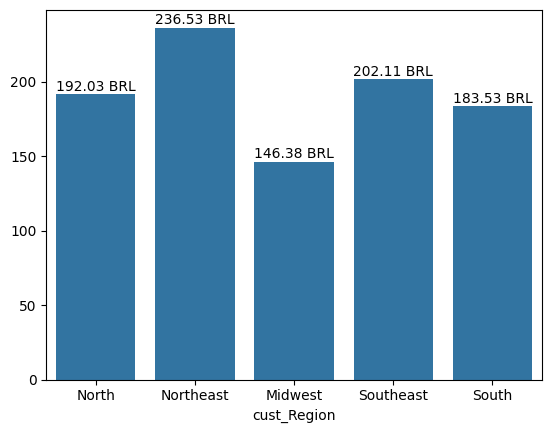

In [ ]:
ax = sns.barplot(ct.mean())

for rect in ax.patches:
    height = rect.get_height()

    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 0.2, str(round(height,2))+' BRL', ha="center", va="bottom"
    )

In [ ]:
# 배송비 평균 금액
ct = pd.crosstab(target.seller_Region, target.cust_Region, values=target.total_freight_value, aggfunc='mean').fillna(0)
ct = ct.reindex(region, axis="rows")
ct = ct.reindex(region, axis="columns")
ct.style.set_precision(2).background_gradient(cmap=sns.light_palette("blue", as_cmap=True), axis=1) # seller 기준 (출발지)

<ipython-input-478-5c3dcae7acd3>:5: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



cust_Region,North,Northeast,Midwest,Southeast,South
seller_Region,,,,,
North,0.00,46.41,0.00,36.50,40.77
Northeast,50.70,23.00,34.05,35.23,50.78
Midwest,28.35,33.92,17.73,24.03,33.76
Southeast,40.10,35.14,25.28,18.80,24.99
South,52.16,51.11,37.32,25.38,21.84


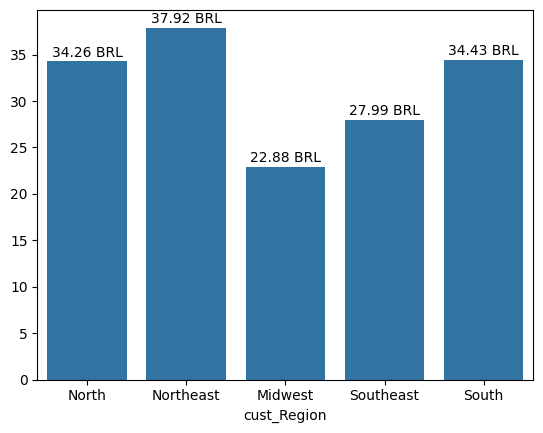

In [ ]:
ax = sns.barplot(ct.mean())

for rect in ax.patches:
    height = rect.get_height()

    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 0.2, str(round(height,2))+' BRL', ha="center", va="bottom"
    )

seller의 지역에서 멀수록 배송비가 비싸진다.
- 대각선 (같은 지역)을 기준으로 멀어질수록 진해짐 (가격이 큼)
- Northeast 지역의 고객들이 평균적으로 더 비싼 배송비를 지불하고 있음

In [ ]:
# 주문량
ct = pd.crosstab(target.seller_Region, target.cust_Region, values=target.freight_value, aggfunc='count').fillna(0)
ct = ct.reindex(region, axis="rows")
ct = ct.reindex(region, axis="columns")
ct.style.set_precision(0).background_gradient(cmap=sns.light_palette("blue", as_cmap=True), axis=0) # customer 기준

<ipython-input-214-357b233d1d62>:5: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



cust_Region,North,Northeast,Midwest,Southeast,South
seller_Region,,,,,
North,0,4,0,18,3
Northeast,45,441,121,799,140
Midwest,44,175,211,894,127
Southeast,1536,7743,4776,57745,10695
South,203,855,654,8444,3122


Southeast의 seller가 가장 많은 판매량을을 보이며,

South 지역이 두 번째로 많은 판매량을 보인다.

### 지역별로 가장 많이 구매 또는 판매하는 카테고리

In [ ]:
import plotly.express as px
fig = px.sunburst(target, path=['product_category_name', 'cust_Region', 'seller_Region'], values='total_product_price',
                  color='product_category_name',
                  width=1000, height=1000)
fig.update_traces(textinfo="label+percent parent+value")
fig.show()

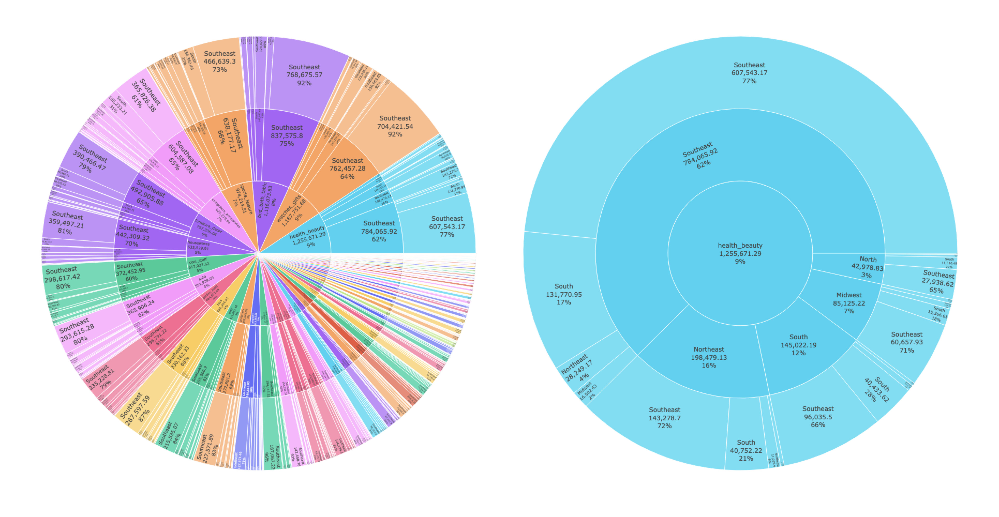

total_product_price (상품 금액) 기준,
1. health_beauty
2. watches_gifts
...

health_beauty 카테고리의 구매자 중 Southeast가 62%, Northeast가 16%, South가 12%이며,

판매 지역은 1. Southeast, 2. South 지역인 것을 관찰 가능

In [ ]:
fig = px.sunburst(target, path=['cust_Region','product_category_name', 'seller_Region'], values='total_price',
                  color='cust_Region',
                  width=1000, height=1000)
fig.update_traces(textinfo="label+percent parent+value")
fig.show()

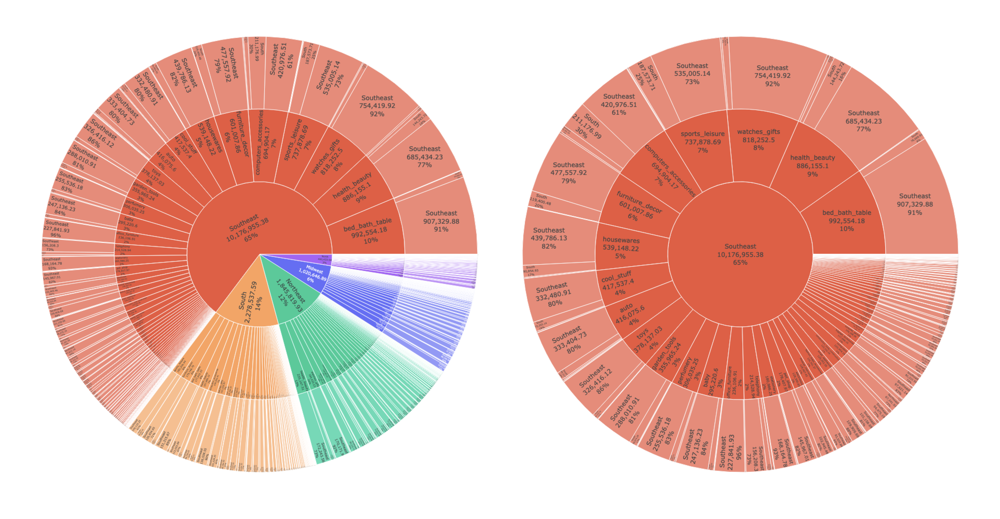

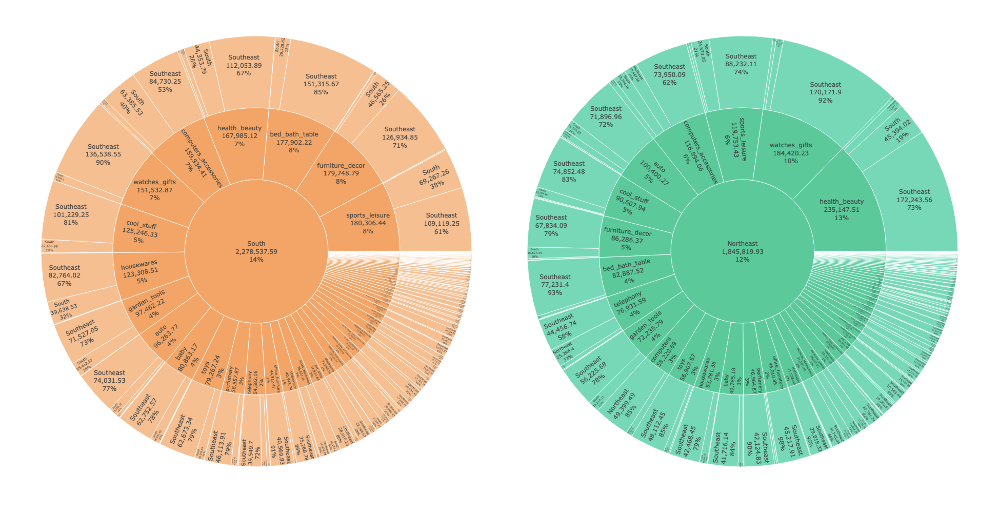

지역별 구매액: 1.Southeast 2.South 3.Northeast

- Southeast 지역 고객들의 구매 카테고리 순위
    1. bed_bath_table
    2. health_beauty
    3. watches_gifts
    4. sports_leisure
    5. computer_acc

- South 지역 고객들의 구매 카테고리 순위
    1. sports_leisures
    2. furniture_decor
    3. bed_bath_table
    4. health_beauty
    5. computer_acc

- Northeast 지역 고객들의 구매 카테고리 순위
    1. health_beauty
    2. watches_gifts
    3. sports_leisures
    4. computer_acc
    5. auto

결론:

**Northeast 지역 고객들이 평균적으로 가장 비싼 배송료**를 지불하고 있으며,

**전채 판매액 1위 카테고리인 health beauty**에서 Southeast 다음으로 **2순위의 구매력**을 보여주고 있음

또한, **health beauty 카테고리가 Northeast에서 구매액 1순위**를 차지함

- 구매력이 높은 Southeast와 South에서는 bed_bath_table과 sports_leisures 카테고리가 1순위

# 3. 시기별 매출 분석
- 시기별 (계절별, 공휴일 기점, …)에 따른 카테고리별 매출 분석


    -> health-beauty 카테고리가 특별하게 튀는 11월(블랙프라이데이) 이후로도 꾸준한 판매량이 관찰됨

[브라질 계절](https://www.booking.com/best-time/country/br.ko.html#best-time--weather)  
- 1월: 여름 극성수기
- **2,3,4월: 우기**
- 5월: 대부분 쾌적
- 6월: 남부 겨울 시작 / 북부 기온 30ºC (남부지역보다 강우량 많음)
- 7월: 겨울
- 8월: 날씨가 온화하고 강우량이 적음
- **9, 10, 11월: 고온 & 건기**
- 12월: 따뜻 & 우기가 점차 돌아옴

In [ ]:
target['order_purchase_month'] = target.order_purchase_timestamp.apply(lambda x: str(x)[:7])

In [ ]:
target.sort_values(by='order_purchase_month', inplace=True)

In [ ]:
target

,order_id,product_id,seller_id,order_item_id,price,freight_value,customer_state,seller_state,product_category_name,order_purchase_timestamp,total_product_price,total_freight_value,total_price,cust_Region,seller_Region,order_purchase_month
109655,bfbd0f9bdef84302105ad712db648a6c,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,3.0,44.99,2.83,SP,PR,health_beauty,2016-09-15 12:16:38,134.97,8.49,143.46,Southeast,South,2016-09
59962,d207cc272675637bfed0062edffd0818,107177bf61755f05c604fe57e02467d6,cca3071e3e9bb7d12640c9fbe2301306,1.0,119.90,13.56,SP,SP,furniture_decor,2016-10-03 22:06:03,119.90,13.56,133.46,Southeast,Southeast,2016-10
107109,6ece326e25f193d084e3dc092bbdd93b,a10553a1882cc51b8910c246613fb0b0,939f6e231201f26803cb5c3a3d2940b3,1.0,59.90,25.92,SC,SP,furniture_decor,2016-10-06 20:15:20,59.90,25.92,85.82,South,Southeast,2016-10
105951,8e7ef380ad5ae407dffbe2f0826cae73,4e77e23d6c2215228d4ab312c0b8d405,0747d5bb69f0586cc869d8af4c50f93e,1.0,32.90,14.52,SP,RJ,perfumery,2016-10-07 09:33:06,32.90,14.52,47.42,Southeast,Southeast,2016-10
4621,7e2dddf174cc4d2768bf39c43ab2bd7a,e41a6ac2f57a273eb0d214c7cbab5db9,a7f13822ceb966b076af67121f87b063,1.0,129.97,29.38,MG,SP,office_furniture,2016-10-09 15:10:41,129.97,29.38,159.35,Southeast,Southeast,2016-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65096,86f347377bc9dbff8cd89feb1b946499,ec5a5cf28e0fbef0c5391157203ab8ce,612170e34b97004b3ba37eae81836b4c,1.0,43.75,17.24,MG,RS,cool_stuff,2018-08-13 13:56:42,43.75,17.24,60.99,Southeast,South,2018-08
42411,86f1238d241a48cdbedf1a46d8532ded,fbce4c4cb307679d89a3bf3d3bb353b9,c33847515fa6305ce6feb1e818569f13,1.0,149.00,51.33,MG,SC,bed_bath_table,2018-08-09 14:50:55,149.00,51.33,200.33,Southeast,South,2018-08
52076,fa28b32a0c26a05aed07e5fec4c54b3a,4ff38de0673d41a0da1499e300720ef6,5b07547f10dd980738a1a27f685af669,2.0,69.90,15.59,RS,SP,health_beauty,2018-08-01 10:27:42,139.80,31.18,170.98,South,Southeast,2018-08
34241,8717b95453a85a457f3f3cbe1aaa118a,ed81ccd0bc6bf90922a03bd003d66db0,b499c00f28f4b7069ff6550af8c1348a,1.0,44.99,17.48,SP,SP,housewares,2018-08-10 22:21:38,44.99,17.48,62.47,Southeast,Southeast,2018-08


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22],
 [Text(0, 0, '2016-09'),
  Text(1, 0, '2016-10'),
  Text(2, 0, '2016-12'),
  Text(3, 0, '2017-01'),
  Text(4, 0, '2017-02'),
  Text(5, 0, '2017-03'),
  Text(6, 0, '2017-04'),
  Text(7, 0, '2017-05'),
  Text(8, 0, '2017-06'),
  Text(9, 0, '2017-07'),
  Text(10, 0, '2017-08'),
  Text(11, 0, '2017-09'),
  Text(12, 0, '2017-10'),
  Text(13, 0, '2017-11'),
  Text(14, 0, '2017-12'),
  Text(15, 0, '2018-01'),
  Text(16, 0, '2018-02'),
  Text(17, 0, '2018-03'),
  Text(18, 0, '2018-04'),
  Text(19, 0, '2018-05'),
  Text(20, 0, '2018-06'),
  Text(21, 0, '2018-07'),
  Text(22, 0, '2018-08')])

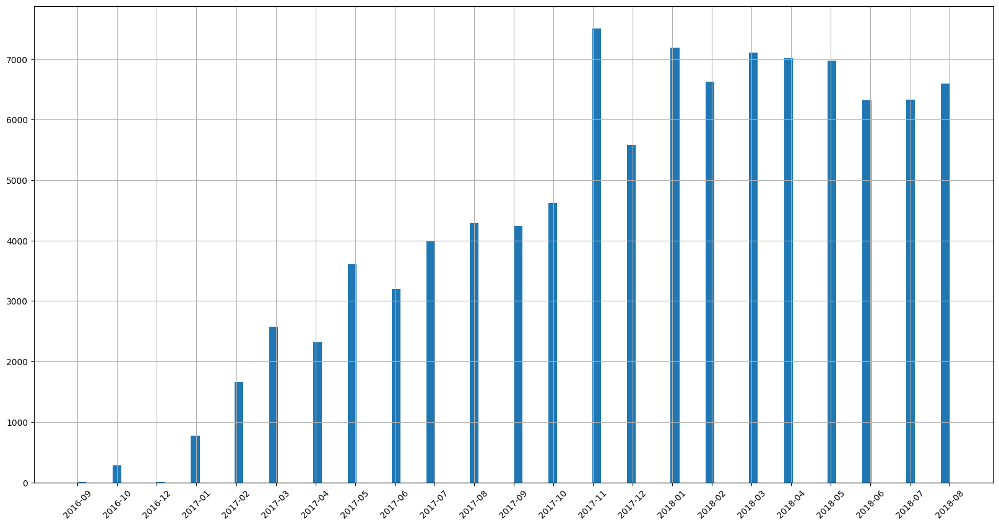

In [ ]:
plt.figure(figsize=(20,10))
target.sort_values(by='order_purchase_month').order_purchase_month.hist(bins=100)
plt.xticks(rotation=45)

In [ ]:
import plotly.express as px
px.line(target.groupby('order_purchase_month').count(), y='order_id', labels=dict(order_id="Num of order_id"))

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22],
 [Text(0, 0, '2016-09'),
  Text(1, 0, '2016-10'),
  Text(2, 0, '2016-12'),
  Text(3, 0, '2017-01'),
  Text(4, 0, '2017-02'),
  Text(5, 0, '2017-03'),
  Text(6, 0, '2017-04'),
  Text(7, 0, '2017-05'),
  Text(8, 0, '2017-06'),
  Text(9, 0, '2017-07'),
  Text(10, 0, '2017-08'),
  Text(11, 0, '2017-09'),
  Text(12, 0, '2017-10'),
  Text(13, 0, '2017-11'),
  Text(14, 0, '2017-12'),
  Text(15, 0, '2018-01'),
  Text(16, 0, '2018-02'),
  Text(17, 0, '2018-03'),
  Text(18, 0, '2018-04'),
  Text(19, 0, '2018-05'),
  Text(20, 0, '2018-06'),
  Text(21, 0, '2018-07'),
  Text(22, 0, '2018-08')])

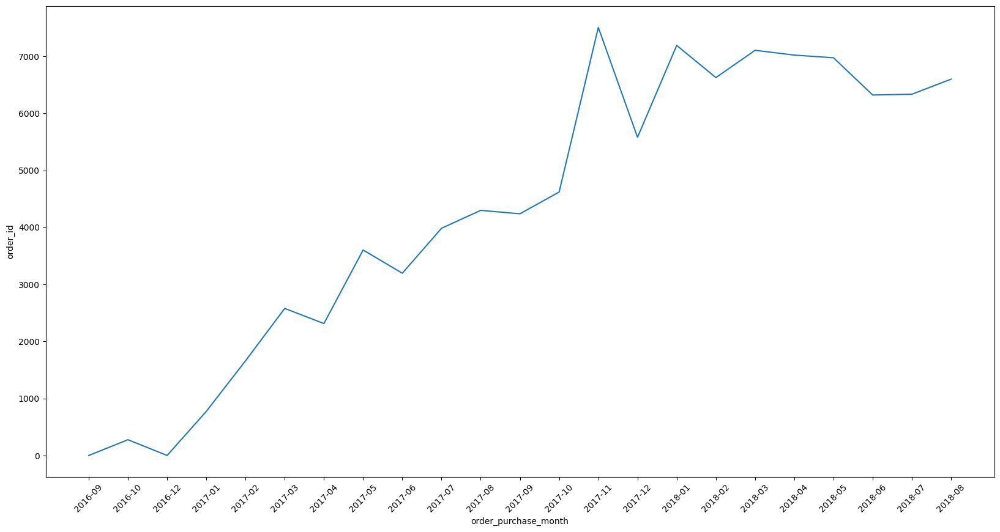

In [ ]:
plt.figure(figsize=(20,10))
sns.lineplot(target.groupby('order_purchase_month').count(),x='order_purchase_month',y='order_id')
plt.xticks(rotation=45)

전체적으로 상승세를 보이며, 11월이 튀면서 최고 판매량을 보임

In [ ]:
tmp = target.groupby(['order_purchase_month', 'product_category_name']).count().reset_index()
tmp = tmp.pivot(index='order_purchase_month', columns='product_category_name').order_id

In [ ]:
MIN = tmp.min().to_frame(name='min')
MAX = tmp.max().to_frame(name='max')
tmp_ = MIN.merge(MAX, on='product_category_name')

In [ ]:
tmp_['diff'] = tmp_['max'] - tmp_['min']

In [ ]:
tmp_.sort_values(by='diff', ascending=False, inplace=True)

In [ ]:
tmp_.iloc[:20].style.set_precision(0).background_gradient(cmap=sns.light_palette("blue", as_cmap=True))

<ipython-input-277-14a9c238d84d>:1: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,min,max,diff
product_category_name,,,
bed_bath_table,6,882,876
computers_accessories,12,828,816
health_beauty,1,807,806
sports_leisure,17,658,641
watches_gifts,4,599,595
housewares,9,558,549
furniture_decor,57,567,510
garden_tools,5,445,440
toys,22,459,437


카테고리별 월별 최저 판매량과 최고 판매량의 차이 (성장세)
1. bed_bath_table
2. computers_accessories
3. health_beauty
4. sports_leisure
5. watches_gifts

In [ ]:
top5_category = tmp_.iloc[:5].index.to_list()

In [ ]:
tmp2 = target[target.product_category_name.isin(top5_category)].groupby(['product_category_name', 'order_purchase_month']).count()
tmp2 = tmp2.reset_index()
px.line(tmp2, color="product_category_name", x="order_purchase_month", y='order_id')

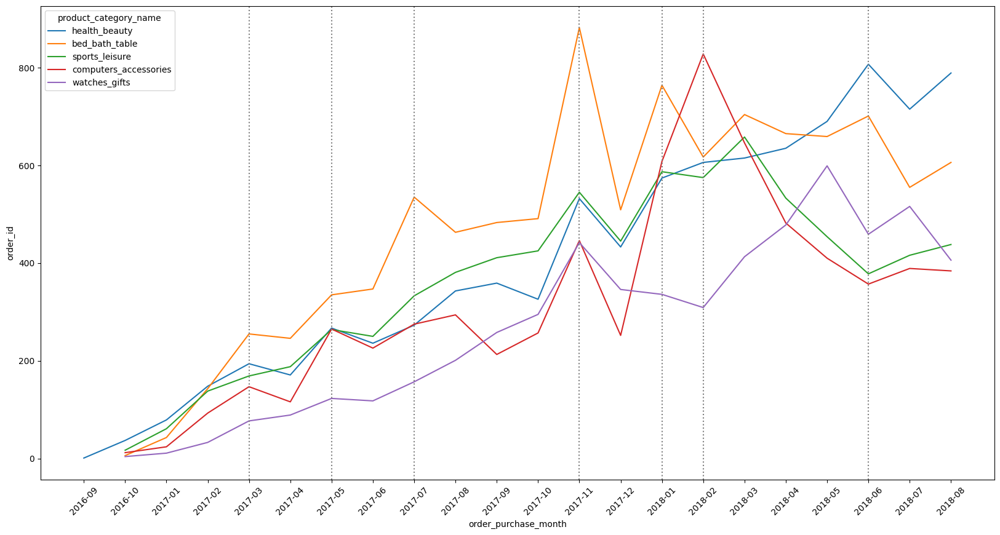

In [ ]:
plt.figure(figsize=(20,10))
sns.lineplot(tmp2.sort_values('order_purchase_month'), x='order_purchase_month', y='order_id', hue='product_category_name')

plt.xticks(rotation=45)

plt.axvline('2017-03', color='grey', linestyle=':')
plt.axvline('2017-05', color='grey', linestyle=':')
plt.axvline('2017-07', color='grey', linestyle=':')
plt.axvline('2017-11', color='grey', linestyle=':')
plt.axvline('2018-01', color='grey', linestyle=':')
plt.axvline('2018-02', color='grey', linestyle=':')
plt.axvline('2018-06', color='grey', linestyle=':')

- health-beauty 카테고리가 특별하게 튀는 11월 이후로도 꾸준한 판매량이 관찰됨

# Northeast 지역의 heath_beauty 카테고리에서 customer의 구매 추세

In [ ]:
tmp2 = target[target.cust_Region=='Northeast'][target.product_category_name.isin(top5_category)].groupby(['product_category_name', 'order_purchase_month']).count()
tmp2 = tmp2.reset_index()

<ipython-input-291-0b0e240f167c>:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [ ]:
tmp2.sort_values(by='order_purchase_month', inplace=True)

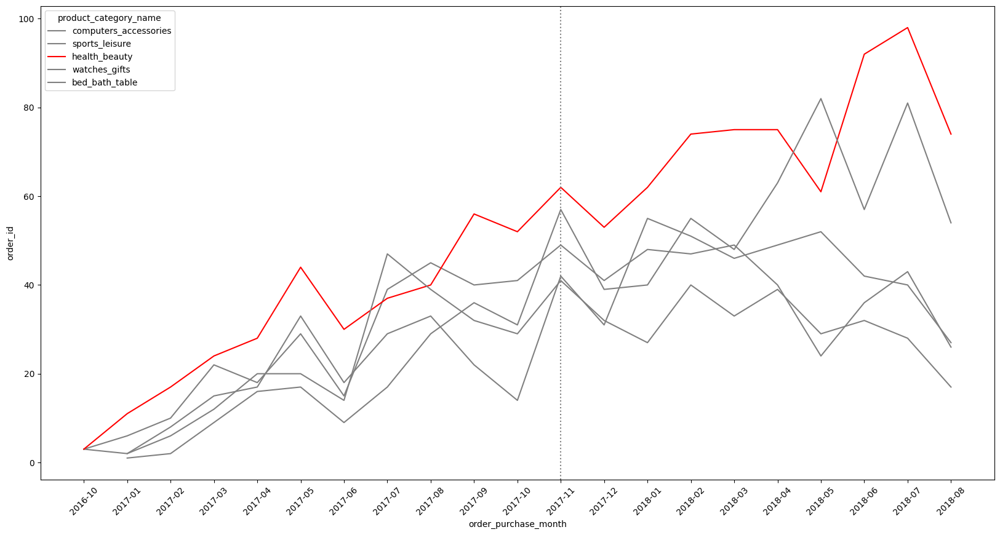

In [ ]:
plt.figure(figsize=(20,10))
sns.lineplot(tmp2, x='order_purchase_month', y='order_id', hue='product_category_name', palette=['grey', 'grey','r', 'grey', 'grey'])

plt.xticks(rotation=45)

# 3,5,7,11,1,2,6
plt.axvline('2017-11', color='grey', linestyle=':')

In [ ]:
tmp = target[target.cust_Region=='Northeast'][target.product_category_name.isin(top5_category)].groupby(['product_category_name', 'order_purchase_month']).sum()
tmp = tmp.reset_index()
tmp.sort_values(by='order_purchase_month', inplace=True)

<ipython-input-296-348793514fac>:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

<ipython-input-296-348793514fac>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [ ]:
tmp[tmp.product_category_name=='health_beauty'].total_price

41      465.67
42     3683.91
43     3823.30
44     5602.13
45     5309.81
46    11702.04
47     8218.92
48     8731.79
49    10316.65
50    10728.83
51    11288.84
52    12743.50
53     9054.42
54    15636.62
55    15043.53
56    15300.48
57    14341.52
58    14508.10
59    19153.97
60    22662.56
61    16830.92
Name: total_price, dtype: float64

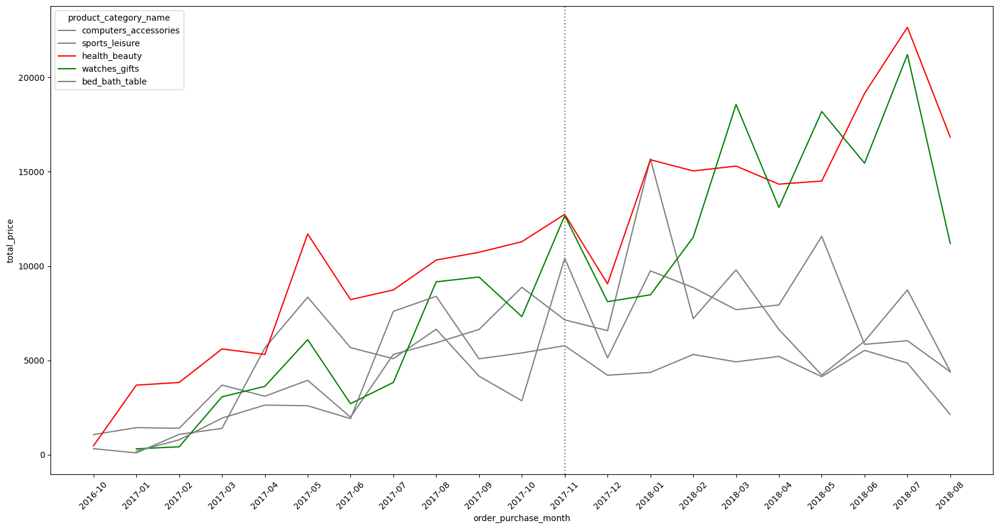

In [ ]:
plt.figure(figsize=(20,10))
sns.lineplot(tmp, x='order_purchase_month', y='total_price', hue='product_category_name', palette=['grey', 'grey', 'r','g', 'grey'])

plt.xticks(rotation=45)

plt.axvline('2017-11', color='grey', linestyle=':')

<ipython-input-437-9f8bb4595840>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
 [Text(0, 0, 'health_beauty'),
  Text(1, 0, 'watches_gifts'),
  Text(2, 0, 'sports_leisure'),
  Text(3, 0, 'computers_accessories'),
  Text(4, 0, 'auto'),
  Text(5, 0, 'cool_stuff'),
  Text(6, 0, 'furniture_decor'),
  Text(7, 0, 'bed_bath_table'),
  Text(8, 0, 'telephony'),
  Text(9, 0, 'garden_tools'),
  Text(10, 0, 'computers'),
  Text(11, 0, 'toys'),
  Text(12, 0, 'housewares'),
  Text(13, 0, 'baby'),
  Text(14, 0, 'perfumery'),
  Text(15, 0, 'office_furniture'),
  Text(16, 0, 'stationery'),
  Text(17, 0, 'musical_instruments'),
  Text(18, 0, 'consoles_games'),
  Text(19, 0, 'electronics')])

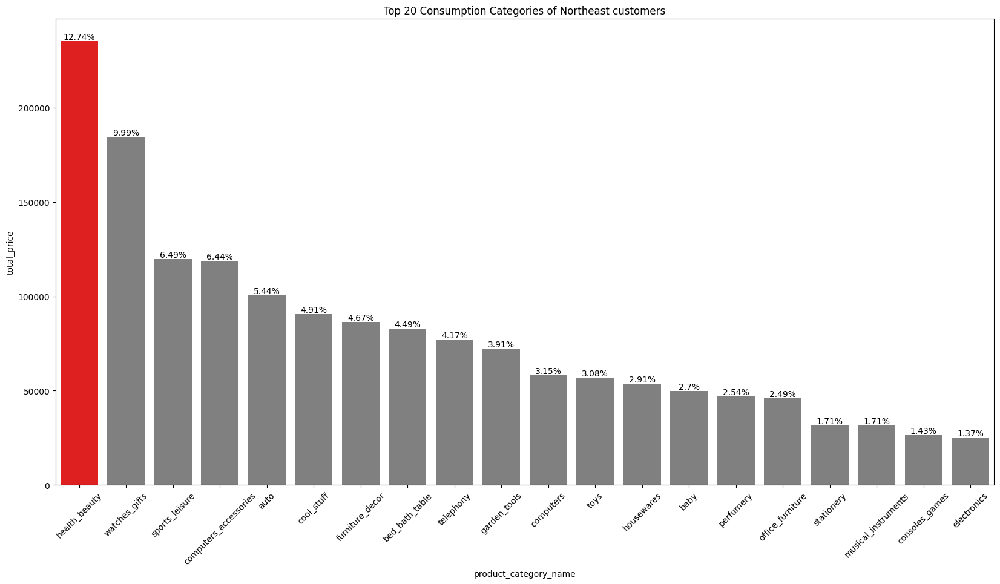

In [ ]:
# pie chart: Northeast 고객들의 소비 카테고리
tmp = target[target.cust_Region=='Northeast'].groupby('product_category_name').total_price.sum()
tmp.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(20,10))

ax = sns.barplot(tmp[:20], palette=['r'] + ['grey']*19)

for rect in ax.patches:
    height = rect.get_height()

    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 5, str(round(100.*int(height)/tmp.values.sum(),2))+'%', ha="center", va="bottom"
    )

plt.title('Top 20 Consumption Categories of Northeast customers')
plt.xticks(rotation=45)

Text(0.5, 1.0, 'Northeast customers’ purchasing area in health beauty category')

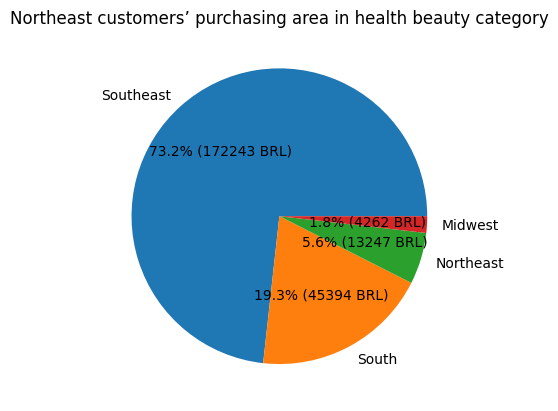

In [ ]:
# pie chart: Northeast 고객들의 health beauty category 구매 지역
tmp = target[(target.cust_Region=='Northeast') & (target.product_category_name == 'health_beauty')].groupby('seller_Region').total_price.sum()
tmp.sort_values(ascending=False, inplace=True)

def func(pct, total_price):
    absolute = int(pct/100.*np.sum(total_price))
    return "{:.1f}% ({:d} BRL)".format(pct, absolute)

plt.pie(tmp, labels=tmp.index, autopct=lambda pct: func(pct, tmp.values))
plt.title('Northeast customers’ purchasing area in health beauty category')

# Northeast 소비자를 위한 health beauty 카테고리에서 배송비를 절약하기 위한 방안


In [ ]:
# health_beauty: Southeast -> Northeast
se2ne = target[(target.cust_Region=='Northeast') & (target.seller_Region=='Southeast')][target.product_category_name=='health_beauty'].copy()

<ipython-input-380-ff851914fe65>:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [ ]:
se2ne.total_freight_value.describe()

count    843.000000
mean      34.359265
std       37.970918
min        0.090000
25%       20.875000
50%       25.630000
75%       36.070000
max      497.080000
Name: total_freight_value, dtype: float64

In [ ]:
# health_beauty: South -> Northeast
s2ne = target[(target.cust_Region=='Northeast') & (target.seller_Region=='South')][target.product_category_name=='health_beauty'].copy()
s2ne.total_freight_value.describe()

<ipython-input-384-d52c7255723d>:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



count    107.000000
mean      43.381308
std       18.244745
min       20.000000
25%       30.500000
50%       38.380000
75%       50.245000
max      156.090000
Name: total_freight_value, dtype: float64

In [ ]:
# health_beauty: Midwest -> Northeast
mw2ne = target[(target.cust_Region=='Northeast') & (target.seller_Region=='Midwest')][target.product_category_name=='health_beauty'].copy()
mw2ne.total_freight_value.describe()

<ipython-input-386-282057a9b780>:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



count    27.000000
mean     31.474444
std      11.773326
min      18.010000
25%      24.165000
50%      27.990000
75%      34.635000
max      70.440000
Name: total_freight_value, dtype: float64

In [ ]:
# health_beauty: Northeast -> Northeast
ne2ne = target[(target.cust_Region=='Northeast') & (target.seller_Region=='Northeast')][target.product_category_name=='health_beauty'].copy()
ne2ne.total_freight_value.describe()

<ipython-input-388-78ad5917e696>:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



count    91.000000
mean     24.306703
std      17.081214
min       8.820000
25%      15.570000
50%      19.370000
75%      21.130000
max      97.440000
Name: total_freight_value, dtype: float64

In [ ]:
# health_beauty: North -> Northeast
n2ne = target[(target.cust_Region=='Northeast') & (target.seller_Region=='North')][target.product_category_name=='health_beauty'].copy()
n2ne.total_freight_value.describe()

<ipython-input-390-00eb6e02921f>:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: total_freight_value, dtype: float64

<ipython-input-391-734645955f86>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Text(0.5, 1.0, 'Average freight_value to ship to Northeast by region')

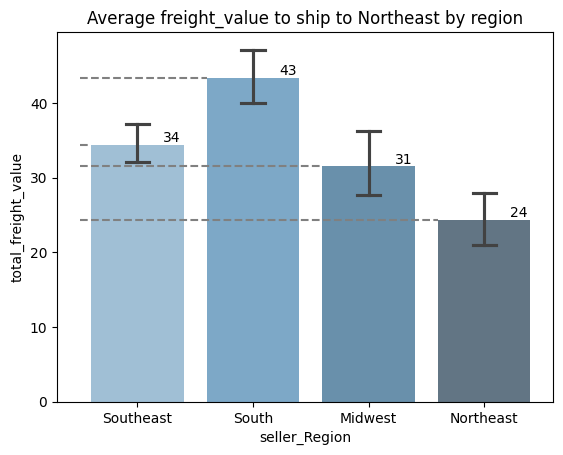

In [ ]:
ax = sns.barplot(pd.concat([se2ne, s2ne, mw2ne, ne2ne]), x='seller_Region', y='total_freight_value', palette="Blues_d", capsize=.2, alpha=0.8)

#x = tmp.index[np.argmax(tmp.order_id)]
#y = np.max(tmp.order_id)
#ax.plot([x]*2, [-1,y], linestyle='--', color='royalblue')
# plt.xticks([10,20,33,40,56,x,63,70])

for rect in ax.patches:
    height = rect.get_height()

    ax.plot([-0.5,rect.get_x()], [height]*2, linestyle='--', color='grey')

    ax.text(
        rect.get_x() + rect.get_width() / 2 + 0.3, height, int(height), ha="center", va="bottom"
    )

# plt.axhline(19, color='grey', linestyle=':')
# plt.axhline(16, color='grey', linestyle=':')
plt.title('Average freight_value to ship to Northeast by region')

In [ ]:
agg_list = ['count', 'mean', 'std', 'min', 'median', 'max', 'sum']
tmp = pd.concat([se2ne.total_freight_value.agg(agg_list).to_frame(), s2ne.total_freight_value.agg(agg_list).to_frame(),
                 mw2ne.total_freight_value.agg(agg_list).to_frame(), ne2ne.total_freight_value.agg(agg_list).to_frame()], axis=1)
tmp.columns = ['Southeast_to_Northeast_tfv', 'South_to_Northeast_tfv', 'Midwest_to_Northeast_tfv', 'Northeast_to_Northeast_tfv']
# tmp.style.highlight_max(axis=1, color='tomato')
tmp.style.set_precision(2).bar(axis=1, color='skyblue',height=50, width=50)

<ipython-input-401-fc313e22520e>:6: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,Southeast_to_Northeast_tfv,South_to_Northeast_tfv,Midwest_to_Northeast_tfv,Northeast_to_Northeast_tfv
count,843.00,107.00,27.00,91.00
mean,34.36,43.38,31.47,24.31
std,37.97,18.24,11.77,17.08
min,0.09,20.00,18.01,8.82
median,25.63,38.38,27.99,19.37
max,497.08,156.09,70.44,97.44
sum,28964.86,4641.80,849.81,2211.91


In [ ]:
## total_payment_value
tmp = pd.concat([se2ne.total_product_price.agg(agg_list).to_frame(), s2ne.total_product_price.agg(agg_list).to_frame(),
                 mw2ne.total_product_price.agg(agg_list).to_frame(), ne2ne.total_product_price.agg(agg_list).to_frame()], axis=1)
tmp.columns = ['Southeast_to_Northeast_tpp', 'South_to_Northeast_tpp', 'Midwest_to_Northeast_tpp', 'Northeast_to_Northeast_tpp']
# tmp.style.highlight_max(axis=1, color='tomato')
tmp.style.set_precision(2).bar(axis=1, color='tomato',height=50, width=50)

<ipython-input-400-4db72199e795>:6: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,Southeast_to_Northeast_tpp,South_to_Northeast_tpp,Midwest_to_Northeast_tpp,Northeast_to_Northeast_tpp
count,843.00,107.00,27.00,91.00
mean,169.96,380.86,126.40,121.27
std,214.52,276.31,63.83,113.52
min,6.00,19.90,35.00,58.99
median,95.00,349.90,116.00,66.99
max,2100.00,1597.35,288.00,599.00
sum,143278.70,40752.22,3412.81,11035.40


- Northeast 지역 고객들이 Southeast와 South 지역에서 약 13%로 health beauty 카테고리 제품을 가장 많이 구매하고 있다.

- health beauty 카테고리의 구매 금액 중 90% 이상이 Southeast와 South 지역에서 발송되고 있다.

- 평균 배송비가 Southeast와 South 지역이 가장 높다. (Southeast: 34.36, South: 43.38)


1. Northeast 지역에 health beauty 카테고리의 seller 확대
    - 신규 입점 프로모션
    - 입점 가이드 제공 (게시글 작성)
2. Southeast 지역과 South 지역에서 북부로 발송하는 제품 대상, 배송 서비스 제공 (ex: 쿠팡)
    - 남부에서 북부로의 배송라인에서 경유지를 정하여, olist측에서 배송 서비스를 제공
    - 남부 seller는 해당 경유지로만 발송
    - 배송 서비스 런칭 비용 대비 이익 계산 필요

# 4. Seller를 위한 방안: 판매량이 높은 물품 (게시글) 분석
- 판매량이 많은 특정 길이 (title과 body) 분석
    - title: ‘사람이 한 눈에 직관적으로 해석 가능한 길이 (단어 수) 관련 연구’ 조사
        - [The Best Title Tag Length for SEO](https://zyppy.com/seo/title-tags/meta-title-tag-length/) -> **50 to 60**
    - body: '상품 설명글의 적절한 길이에 대한 연구' 조사
        - [How long should a blog post be? The ideal in 2024](https://www.wix.com/blog/how-long-should-a-blog-post-be) -> **300 to 800**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119143 entries, 0 to 119142
Data columns (total 39 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       119143 non-null  object 
 1   order_item_id                  118310 non-null  float64
 2   product_id                     118310 non-null  object 
 3   seller_id                      118310 non-null  object 
 4   shipping_limit_date            118310 non-null  object 
 5   price                          118310 non-null  float64
 6   freight_value                  118310 non-null  float64
 7   customer_id                    119143 non-null  object 
 8   order_status                   119143 non-null  object 
 9   order_purchase_timestamp       119143 non-null  object 
 10  order_approved_at              118966 non-null  object 
 11  order_delivered_carrier_date   117057 non-null  object 
 12  order_delivered_customer_date 

In [ ]:
# 관련 로그
cols = ['order_id', 'product_id', 'product_category_name', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty']

# 분석 대상: order_status == delivered
tar = df[df.order_status == 'delivered'][cols].copy()

In [ ]:
# 전처리: (order_id, product_id) 하나씩만 남기기
tar.drop_duplicates(inplace=True)
tar.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100196 entries, 0 to 119142
Data columns (total 6 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   order_id                    100196 non-null  object 
 1   product_id                  100196 non-null  object 
 2   product_category_name       98795 non-null   object 
 3   product_name_lenght         98795 non-null   float64
 4   product_description_lenght  98795 non-null   float64
 5   product_photos_qty          98795 non-null   float64
dtypes: float64(3), object(3)
memory usage: 5.4+ MB


In [ ]:
tar.describe()

,product_name_lenght,product_description_lenght,product_photos_qty
count,98795.000000,98795.000000,98795.000000
mean,48.904702,786.556162,2.240771
std,9.979992,649.701306,1.743676
min,5.000000,4.000000,1.000000
25%,43.000000,348.000000,1.000000
50%,52.000000,603.000000,2.000000
75%,57.000000,986.000000,3.000000
max,76.000000,3992.000000,20.000000


In [ ]:
# 판매 품목 개수
tar.product_id.nunique()

32216

<Axes: >

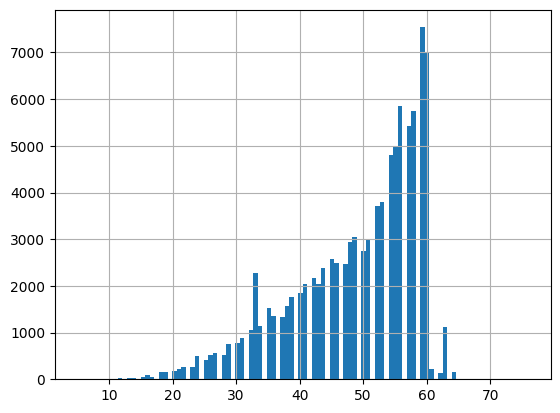

In [ ]:
# product_name_lenght: 상품명 길이별 판매량
# min: 5
# max: 76
tar.product_name_lenght.hist(bins=100)

In [ ]:
tar.groupby('product_name_lenght').count().order_id.to_frame()

,order_id
product_name_lenght,
5.0,9
6.0,2
7.0,1
8.0,3
9.0,12
10.0,5
11.0,7
12.0,37
13.0,25


In [ ]:
tmp = tar.groupby('product_name_lenght').count().order_id.to_frame()

In [ ]:
px.line(tmp, y='order_id')

([<matplotlib.axis.XTick at 0x7f0e38eee7a0>,
 [Text(10.0, 0, '10'),
  Text(20.0, 0, '20'),
  Text(33.0, 0, '33'),
  Text(40.0, 0, '40'),
  Text(56.0, 0, '56'),
  Text(59.0, 0, '59'),
  Text(63.0, 0, '63'),
  Text(70.0, 0, '70')])

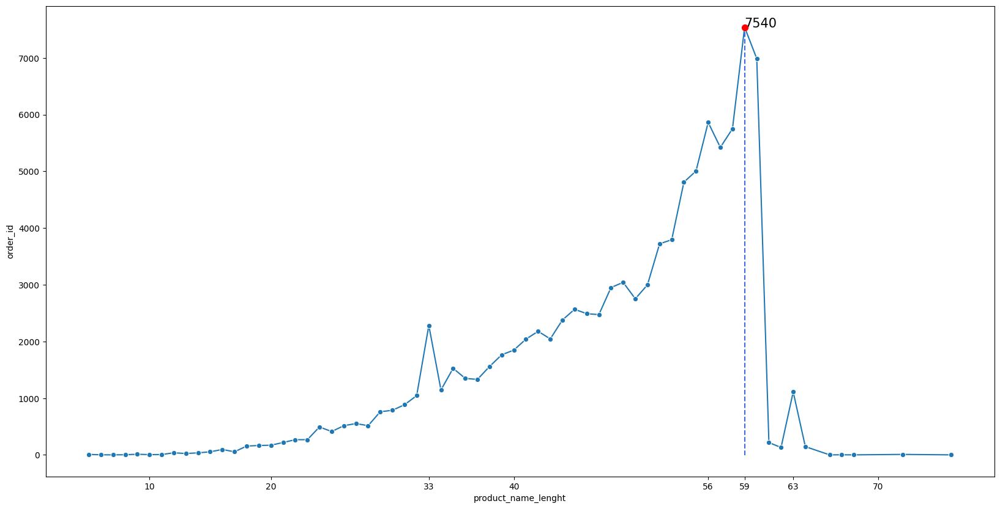

In [ ]:
plt.figure(figsize=(20, 10))
ax = sns.lineplot(tmp, y='order_id', x='product_name_lenght', marker='o')

import numpy as np
x = tmp.index[np.argmax(tmp.order_id)]
y = np.max(tmp.order_id)
ax.text(x, y, y, fontsize=15)
ax.scatter(x, y, c='red',s=50, zorder=20)
ax.plot([x]*2, [-1,y], linestyle='--', color='royalblue')
plt.xticks([10,20,33,40,56,x,63,70])

**[The Best Title Tag Length for SEO](https://zyppy.com/seo/title-tags/meta-title-tag-length/)**
- SEO: Search Engine Optimisation
- From our research, **the optimal title tag length for SEO is between 50 to 60 characters long**.
- Much has been written about Google’s display limit of titles. The most common answer you’ll find on the internet is Google’s desktop **display limit is 600 pixels**, which typically equals about **50-60 characters**.

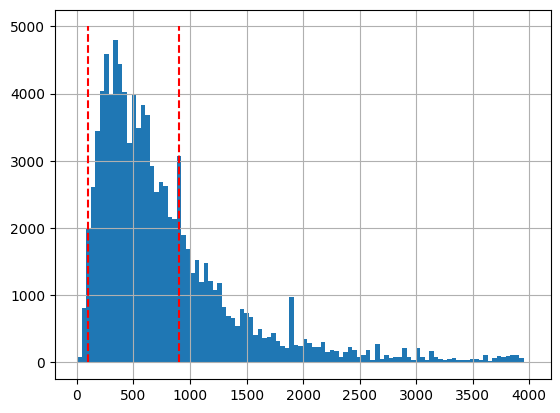

In [ ]:
# product_description_lenght: 상품 상세 설명 길이별 판매량
# min: 4
# max: 3992
ax = tar.product_description_lenght.hist(bins=100)

ax.plot([100]*2, [-1,5000], linestyle='--', color='red')
ax.plot([900]*2, [-1,5000], linestyle='--', color='red')

In [ ]:
px.violin(tar, x='product_description_lenght', points="all", box=True)

In [ ]:
tar.product_description_lenght.describe()

count    98795.000000
mean       786.556162
std        649.701306
min          4.000000
25%        348.000000
50%        603.000000
75%        986.000000
max       3992.000000
Name: product_description_lenght, dtype: float64

([<matplotlib.axis.XTick at 0x7f0e399ccf70>,
 [Text(0, 0, '0'),
  Text(348, 0, '348'),
  Text(603, 0, '603'),
  Text(986, 0, '986'),
  Text(2000, 0, '2000'),
  Text(3000, 0, '3000'),
  Text(4000, 0, '4000')])

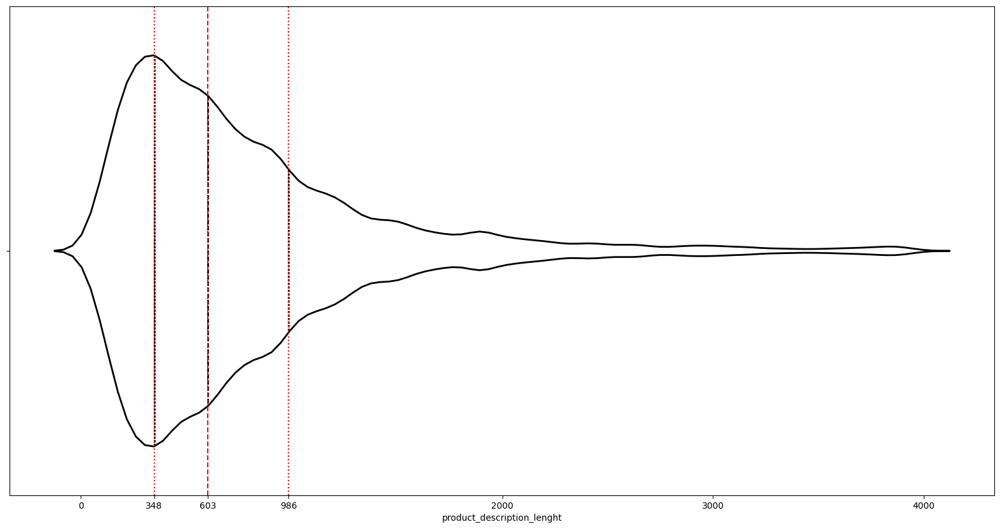

In [ ]:
plt.figure(figsize=(20, 10))
ax = sns.violinplot(tar, x='product_description_lenght', inner='quart', color='w', linecolor='black', linewidth=2)
plt.axvline(348, color='red', linestyle=':')    # 25%
plt.axvline(603, color='red', linestyle='--')   # median
plt.axvline(986, color='red', linestyle=':')    # 75%
plt.xticks([0,348, 603, 986, 2000,3000,4000])

**[How long should a blog post be? The ideal in 2024](https://www.wix.com/blog/how-long-should-a-blog-post-be)**
- **300 - 600 words:** This average **blog post** length used to be considered “**standard**” in the past. Now, this window of words is too short for showing authority to rank on search engines as it won’t typically give you enough room to go deep on a topic.
- **600 - 800 words:** This range is most common in professional journalism and in newspaper articles. Also, **product description** and [encyclopedia](https://www.wix.com/encyclopedia) entries often fall in this word count window. These articles can begin to get you some shares and backlinks.

# 5. appendix: 구매/지불/입고 시점 간의 차이에 따른 관계
고객이 구매한 시점하고 지불시점하고 입고한 시점의 차이에 따른 관계
- review랑은 관계없는듯!
- seller 상세 분석 (shipping_limit_date: 주문 처리 위한 발송 제한 날짜)

In [ ]:
cols

['order_id',
 'order_status',
 'order_purchase_timestamp',
 'order_approved_at',
 'order_delivered_carrier_date',
 'order_delivered_customer_date',
 'order_estimated_delivery_date']

In [ ]:
# 승인 - 구매
df['diff_approved_seconds'] = pd.to_datetime(df.order_approved_at) - pd.to_datetime(df.order_purchase_timestamp)
df['diff_approved_seconds']

0        0 days 00:10:42
1        0 days 00:10:42
2        0 days 00:10:42
3        0 days 01:35:45
4        0 days 00:18:28
               ...      
119138   4 days 05:54:42
119139   0 days 00:00:00
119140   0 days 01:38:00
119141   0 days 00:22:19
119142   0 days 09:54:29
Name: diff_approved_seconds, Length: 119143, dtype: timedelta64[ns]

In [ ]:
df['diff_approved_seconds'] = df['diff_approved_seconds'].astype('timedelta64[s]')
df['diff_approved_seconds']

0            642.0
1            642.0
2            642.0
3           5745.0
4           1108.0
            ...   
119138    366882.0
119139         0.0
119140      5880.0
119141      1339.0
119142     35669.0
Name: diff_approved_seconds, Length: 119143, dtype: float64

In [ ]:
# 출고 - 승인
df['diff_delivered_carrier_seconds'] = pd.to_datetime(df.order_delivered_carrier_date) - pd.to_datetime(df.order_approved_at)
df['diff_delivered_carrier_seconds'] = df['diff_delivered_carrier_seconds'].astype('timedelta64[s]')
df['diff_delivered_carrier_seconds']

0         204465.0
1         204465.0
2         204465.0
3         156197.0
4         168748.0
            ...   
119138    -92632.0
119139         NaN
119140     13773.0
119141    139940.0
119142     49471.0
Name: diff_delivered_carrier_seconds, Length: 119143, dtype: float64

In [ ]:
# 출고가 승인보다 빠름
df[df.order_id=='1ab38815794efa43d269d62b98dae815'][cols]

,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
119138,1ab38815794efa43d269d62b98dae815,delivered,2018-07-01 10:23:10,2018-07-05 16:17:52,2018-07-04 14:34:00,2018-07-09 15:06:57,2018-07-20 00:00:00


In [ ]:
# 출고 - 구매
df['diff_purchase_carrier_seconds'] = pd.to_datetime(df.order_delivered_carrier_date) - pd.to_datetime(df.order_purchase_timestamp)
df['diff_purchase_carrier_seconds'] = df['diff_purchase_carrier_seconds'].astype('timedelta64[s]')
df['diff_purchase_carrier_seconds']

0         205107.0
1         205107.0
2         205107.0
3         161942.0
4         169856.0
            ...   
119138    274250.0
119139         NaN
119140     19653.0
119141    141279.0
119142     85140.0
Name: diff_purchase_carrier_seconds, Length: 119143, dtype: float64

In [ ]:
# 예상 배달 소요시간
df['estimated_delivery_seconds'] = pd.to_datetime(df.order_estimated_delivery_date) - pd.to_datetime(df.order_delivered_carrier_date)
df['estimated_delivery_seconds'] = df['estimated_delivery_seconds'].astype('timedelta64[s]')
df['estimated_delivery_seconds']

0         1137900.0
1         1137900.0
2         1137900.0
3          894687.0
4          887057.0
            ...    
119138    1329960.0
119139          NaN
119140    1932360.0
119141    1251120.0
119142    1060800.0
Name: estimated_delivery_seconds, Length: 119143, dtype: float64

In [ ]:
# 실제 배달 소요시간
df['actual_delivery_seconds'] = pd.to_datetime(df.order_delivered_customer_date) - pd.to_datetime(df.order_delivered_carrier_date)
df['actual_delivery_seconds'] = df['actual_delivery_seconds'].astype('timedelta64[s]')
df['actual_delivery_seconds']

0          523813.0
1          523813.0
2          523813.0
3           83770.0
4          262458.0
            ...    
119138     433977.0
119139          NaN
119140     804815.0
119141    1680209.0
119142     421901.0
Name: actual_delivery_seconds, Length: 119143, dtype: float64

In [ ]:
# 예상 - 실제 (positive: early, negative: late)
df['diff_estimated_actual_delivery_seconds'] = df.estimated_delivery_seconds - df.actual_delivery_seconds
df['diff_estimated_actual_delivery_seconds']

0          614087.0
1          614087.0
2          614087.0
3          810917.0
4          624599.0
            ...    
119138     895983.0
119139          NaN
119140    1127545.0
119141    -429089.0
119142     638899.0
Name: diff_estimated_actual_delivery_seconds, Length: 119143, dtype: float64

<Axes: xlabel='review_score', ylabel='diff_approved_seconds'>

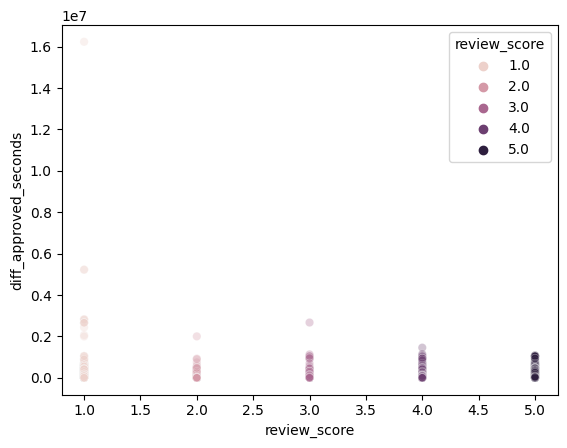

In [ ]:
import seaborn as sns

# 승인 - 구매
sns.scatterplot(data=df, y="diff_approved_seconds", x='review_score', hue='review_score', alpha=0.3)

<Axes: xlabel='review_score', ylabel='diff_delivered_carrier_seconds'>

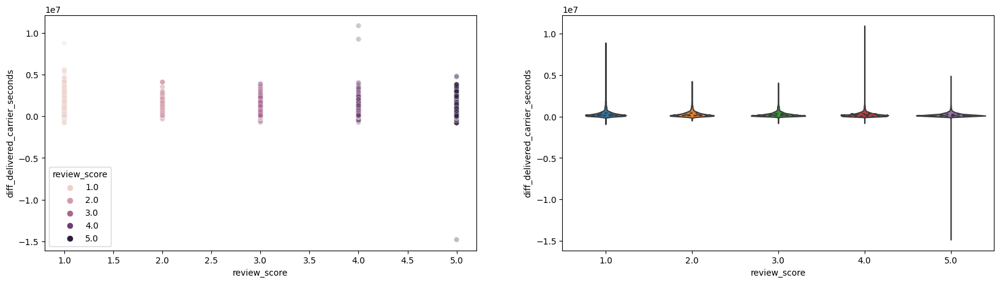

In [ ]:
# 출고 - 승인
plt.figure(figsize=(20,5))
plt.subplot(121)
sns.scatterplot(data=df, y='diff_delivered_carrier_seconds', x='review_score', hue='review_score', alpha=0.3)

plt.subplot(122)
sns.violinplot(data=df, y='diff_delivered_carrier_seconds', x='review_score', showmedians=True, split=True, inner="quart")

<Axes: xlabel='review_score', ylabel='diff_purchase_carrier_seconds'>

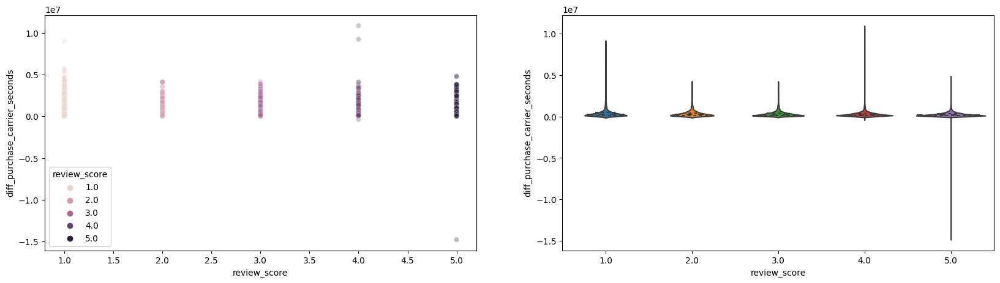

In [ ]:
# 출고 - 구매
plt.figure(figsize=(20,5))
plt.subplot(121)
sns.scatterplot(data=df, y='diff_purchase_carrier_seconds', x='review_score', hue='review_score', alpha=0.3)

plt.subplot(122)
sns.violinplot(data=df, y='diff_purchase_carrier_seconds', x='review_score', showmedians=True, split=True, inner="quart")

<Axes: xlabel='review_score', ylabel='estimated_delivery_seconds'>

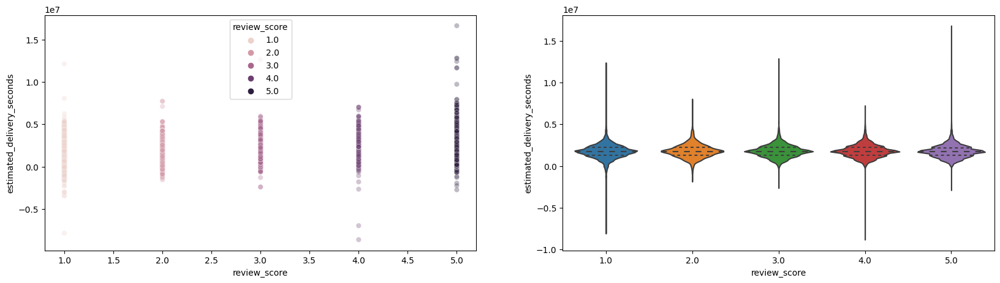

In [ ]:
# 예상 배달 소요시간
plt.figure(figsize=(20,5))
plt.subplot(121)
sns.scatterplot(data=df, y='estimated_delivery_seconds', x='review_score', hue='review_score', alpha=0.3)

plt.subplot(122)
sns.violinplot(data=df, y='estimated_delivery_seconds', x='review_score', showmedians=True, split=True, inner="quart")

<Axes: xlabel='review_score', ylabel='actual_delivery_seconds'>

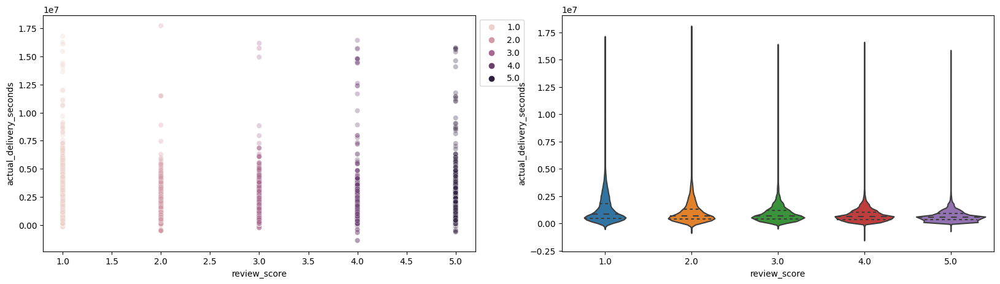

In [ ]:
# 실제 배달 소요시간
plt.figure(figsize=(20,5))
plt.subplot(121)
sns.scatterplot(data=df, y='actual_delivery_seconds', x='review_score', hue='review_score', alpha=0.3)
plt.legend(bbox_to_anchor=(1, 1))

plt.subplot(122)
sns.violinplot(data=df, y='actual_delivery_seconds', x='review_score', showmedians=True, split=True, inner="quart")

<Axes: xlabel='review_score', ylabel='diff_estimated_actual_delivery_seconds'>

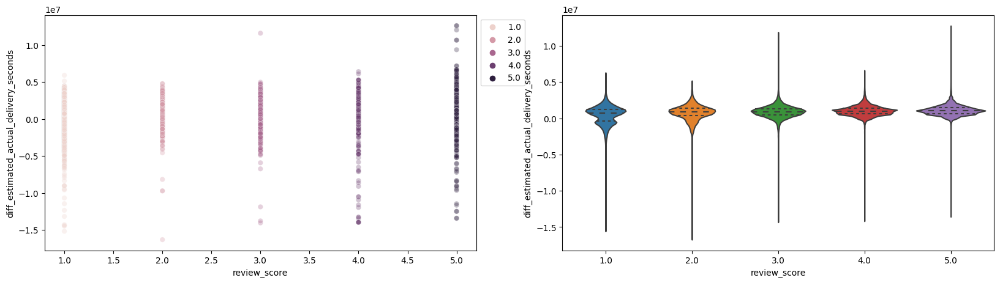

In [ ]:
# 예상 - 실제 (positive: early, negative: late)
plt.figure(figsize=(20,5))
plt.subplot(121)
sns.scatterplot(data=df, y='diff_estimated_actual_delivery_seconds', x='review_score', hue='review_score', alpha=0.3)
plt.legend(bbox_to_anchor=(1, 1))

plt.subplot(122)
sns.violinplot(data=df, y='diff_estimated_actual_delivery_seconds', x='review_score', showmedians=True, split=True, inner="quart")

In [ ]:
df.diff_estimated_actual_delivery_seconds

0          614087.0
1          614087.0
2          614087.0
3          810917.0
4          624599.0
            ...    
119138     895983.0
119139          NaN
119140    1127545.0
119141    -429089.0
119142     638899.0
Name: diff_estimated_actual_delivery_seconds, Length: 119143, dtype: float64

In [ ]:
# 예상 - 실제 (positive: early, negative: late)
# 늦으면 1로 라벨링
df.diff_estimated_actual_delivery_seconds.apply(lambda x: 0 if x > 0 else 1)

0         0
1         0
2         0
3         0
4         0
         ..
119138    0
119139    1
119140    0
119141    1
119142    0
Name: diff_estimated_actual_delivery_seconds, Length: 119143, dtype: int64

In [ ]:
df['islate'] = df.diff_estimated_actual_delivery_seconds.apply(lambda x: 0 if x > 0 else 1)

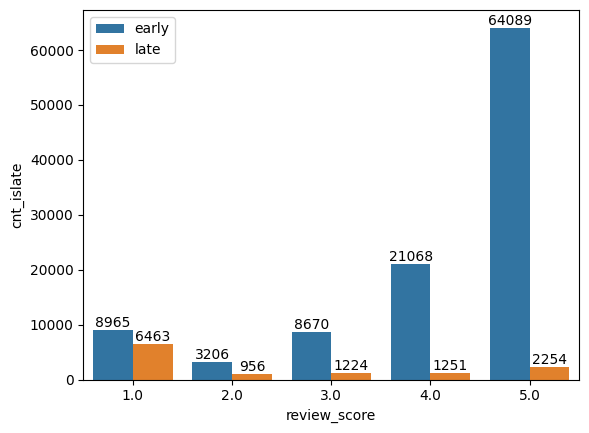

In [ ]:
tmp = df.groupby('review_score')['islate'].value_counts().to_frame()
tmp = tmp.rename(columns={'islate':'cnt_islate'}).reset_index()

ax = sns.barplot(tmp, x="review_score", y="cnt_islate", hue="islate")

for rect in ax.patches:
    height = rect.get_height()

    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 5, int(height), ha="center", va="bottom"
    )

handles, _ = ax.get_legend_handles_labels()
ax.legend(handles, ['early', 'late'])

(-5.0, 120.0)

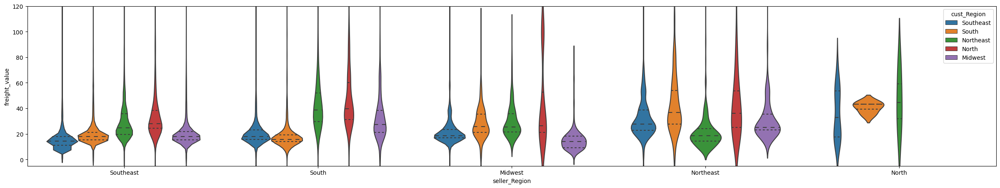

In [ ]:
plt.figure(figsize=(30,5))
sns.violinplot(data=df, x="seller_Region", y="freight_value", hue="cust_Region", inner='quarts')
plt.ylim([-5,120])